In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import yfinance as yf
import pandas_datareader as pdr
import requests_cache
import scipy.optimize as sco
from scipy import stats
import seaborn as sns
import statsmodels.api as sm
from datetime import datetime, timedelta
session = requests_cache.CachedSession()

In [2]:
pd.set_option('display.float_format', '{:.4f}'.format)
%precision 4
%config InlineBackend.figure_format = 'retina'

In [3]:
def get_asset_data(start_date='2015-01-01', end_date=None):
    """
    Download price data for Bitcoin, Gold ETF, PCEPI, and market factors
    
    Parameters:
    start_date (str): Start date for data collection
    end_date (str): End date for data collection, defaults to today
    
    Returns:
    pandas.DataFrame: Combined dataset with all required financial data
    """
    # Download Bitcoin data
    btc = (
        yf.download('BTC-USD', start=start_date, end=end_date, progress=False)
        ['Adj Close']
        .to_frame('BTC')
    )
    
    
    # Download Gold ETF data
    gld = (
        yf.download('GLD', start=start_date, end=end_date, progress=False)
        ['Adj Close']
        .to_frame('GLD')
    )
    
    
    # Download SPY ETF data
    spy = (
        yf.download('SPY', start=start_date, end=end_date, progress=False)
        ['Adj Close']
        .to_frame('SPY')
    )
    # Download PCEPI data
    pcepi = (
        pdr.DataReader('PCEPI', 'fred', start=start_date, end=end_date)
        .rename(columns={'PCEPI': 'Price_Level'})
    )
    
    # Download Fama-French factors for market returns
    ff = (
        pdr.DataReader('F-F_Research_Data_Factors_daily', 'famafrench', start=start_date)[0]
        .assign(Mkt=lambda x: x['Mkt-RF'] + x['RF'])
        .div(100)
    )
    
    # Combine all data
    assets = pd.concat([btc, gld, spy], axis=1)
    return assets.join([pcepi, ff], how='inner')

def calculate_returns_and_inflation(df, frequency='M'):
    """
    Calculate returns and inflation rates at specified frequency
    
    Parameters:
    df (pandas.DataFrame): Input dataframe with price data
    frequency (str): Resampling frequency ('D' for daily, 'M' for monthly)
    
    Returns:
    pandas.DataFrame: DataFrame with asset returns and inflation rate
    """
    # Calculate asset returns
    price_cols = ['BTC', 'GLD', 'SPY']
    returns = df[price_cols].pct_change()
    
    # Calculate inflation rate (PCEPI percent change)
    inflation = df['Price_Level'].pct_change()
    inflation.name = 'Inflation'
    
    # Combine returns and inflation
    all_returns = pd.concat([returns, inflation, df['Mkt']], axis=1)
    
    if frequency == 'M':
        all_returns = all_returns.resample('M').agg(lambda x: (1 + x).prod() - 1)
    
    return all_returns.dropna()

def calculate_hedge_ratios(returns_df, target_col='Inflation', window=12):
    """
    Calculate dynamic hedge ratios using rolling betas
    
    Parameters:
    returns_df (pandas.DataFrame): DataFrame with returns
    target_col (str): Column name of the risk to hedge against
    window (int): Rolling window size
    
    Returns:
    pandas.DataFrame: Hedge ratios for each asset
    """
    hedge_ratios = pd.DataFrame(index=returns_df.index)
    asset_cols = ['BTC', 'GLD', 'SPY']
    
    for asset in asset_cols:
        # Calculate rolling beta (hedge ratio)
        covariance = returns_df[[target_col, asset]].rolling(window).cov()
        variance = returns_df[target_col].rolling(window).var()
        
        # Get the covariance between target and asset
        cov_values = covariance.unstack()[asset][target_col]
        
        # Calculate and store hedge ratio
        hedge_ratios[f'{asset}_Hedge_Ratio'] = cov_values / variance
    
    return hedge_ratios

def analyze_hedging_performance(returns_df, hedge_ratios, risk_free_rate=0):
    """
    Analyze hedging performance with comprehensive metrics
    
    Parameters:
    returns_df (pandas.DataFrame): DataFrame with asset returns
    hedge_ratios (pandas.DataFrame): DataFrame with hedge ratios
    risk_free_rate (float): Annual risk-free rate
    
    Returns:
    dict: Dictionary containing performance metrics and hedged returns
    """
    # Calculate hedged portfolio returns
    hedged_returns = pd.DataFrame(index=returns_df.index)
    
    for asset in ['BTC', 'GLD', 'SPY']:
        hedge_ratio = hedge_ratios[f'{asset}_Hedge_Ratio'].fillna(method='ffill')
        hedged_returns[f'{asset}_Hedged'] = (
            returns_df[asset] - hedge_ratio * returns_df['Inflation']
        )
    
    def calculate_metrics(returns):
        """Calculate key performance metrics for a return series"""
        annualized_return = (1 + returns.mean()) ** 12 - 1
        annualized_vol = returns.std() * np.sqrt(12)
        sharpe = (annualized_return - risk_free_rate) / annualized_vol
        max_drawdown = (returns.cumsum() - returns.cumsum().cummax()).min()
        
        return {
            'Annual Return': annualized_return,
            'Annual Volatility': annualized_vol,
            'Sharpe Ratio': sharpe,
            'Max Drawdown': max_drawdown,
            'Inflation Beta': calculate_beta(returns, returns_df['Inflation'])
        }
    
    def calculate_beta(returns, factor):
        """Calculate beta with respect to a factor"""
        covar = np.cov(returns, factor)[0,1]
        var = np.var(factor)
        return covar / var if var != 0 else np.nan
    
    # Calculate metrics for both unhedged and hedged positions
    performance = {}
    for asset in ['BTC', 'GLD', 'SPY']:
        performance[f'{asset}_Unhedged'] = calculate_metrics(returns_df[asset])
        performance[f'{asset}_Hedged'] = calculate_metrics(hedged_returns[f'{asset}_Hedged'])
    
    return {
        'performance_metrics': pd.DataFrame(performance),
        'hedged_returns': hedged_returns
    }

# Get the data
data = get_asset_data('2015-01-01')

# Calculate monthly returns and inflation
returns = calculate_returns_and_inflation(data, frequency='M')

# Calculate hedge ratios
hedge_ratios = calculate_hedge_ratios(returns)

# Analyze hedging performance
results = analyze_hedging_performance(returns, hedge_ratios)

In [4]:
data

,BTC,GLD,SPY,Price_Level,Mkt-RF,SMB,HML,RF,Mkt
2015-04-01,247.2720,115.6000,173.5911,97.0940,-0.0038,0.0033,0.0044,0.0000,-0.0038
2015-05-01,232.0790,113.0800,177.8275,97.3270,0.0101,-0.0030,-0.0060,0.0000,0.0101
2015-06-01,222.9260,114.0000,178.5449,97.5160,0.0017,-0.0004,-0.0022,0.0000,0.0017
2015-07-01,258.6210,111.9800,175.9620,97.6050,0.0061,-0.0077,-0.0003,0.0000,0.0061
2015-09-01,228.1210,109.2000,162.6228,97.4770,-0.0291,0.0030,-0.0050,0.0000,-0.0291
...,...,...,...,...,...,...,...,...,...
2024-04-01,69702.1484,207.8200,517.1487,123.2340,-0.0027,-0.0090,-0.0027,0.0002,-0.0025
2024-05-01,58254.0117,213.7900,495.5481,123.2240,-0.0027,0.0112,-0.0003,0.0002,-0.0025
2024-07-01,62851.9805,215.5700,541.8488,123.5750,0.0022,-0.0099,-0.0046,0.0002,0.0024
2024-08-01,65357.5000,225.7700,539.5336,123.7270,-0.0161,-0.0132,-0.0067,0.0002,-0.0159


In [5]:
returns

,BTC,GLD,SPY,Inflation,Mkt
2015-04-30,0.0000,0.0000,0.0000,0.0000,-0.0038
2015-05-31,-0.0614,-0.0218,0.0244,0.0024,0.0101
2015-06-30,-0.0394,0.0081,0.0040,0.0019,0.0017
2015-07-31,0.1601,-0.0177,-0.0145,0.0009,0.0061
2015-08-31,0.0000,0.0000,0.0000,0.0000,0.0000
...,...,...,...,...,...
2024-06-30,0.0000,0.0000,0.0000,0.0000,0.0000
2024-07-31,0.0789,0.0083,0.0934,0.0028,0.0024
2024-08-31,0.0399,0.0473,-0.0043,0.0012,-0.0159
2024-09-30,0.0000,0.0000,0.0000,0.0000,0.0000


In [6]:
hedge_ratios

,BTC_Hedge_Ratio,GLD_Hedge_Ratio,SPY_Hedge_Ratio
2015-04-30,NaN,NaN,NaN
2015-05-31,NaN,NaN,NaN
2015-06-30,NaN,NaN,NaN
2015-07-31,NaN,NaN,NaN
2015-08-31,NaN,NaN,NaN
...,...,...,...
2024-06-30,17.5623,-2.0010,13.0559
2024-07-31,15.6776,-2.6482,14.1292
2024-08-31,16.7698,-1.8278,12.9170
2024-09-30,26.5984,-0.5206,14.4201


In [32]:
def plot_hedging_analysis(returns_df, hedge_ratios, hedged_returns, performance_metrics):
    """
    Plot key results from the hedging analysis with enhanced visuals using Plotly.

    Parameters:
    - returns_df (pandas.DataFrame): DataFrame containing unhedged returns and inflation.
    - hedge_ratios (pandas.DataFrame): DataFrame of hedge ratios for each asset.
    - hedged_returns (pandas.DataFrame): DataFrame of hedged returns for each asset.
    - performance_metrics (pandas.DataFrame): Performance metrics for assets.
    """
    # Plot 1: Inflation and Unhedged Returns
    fig1 = go.Figure()

    for col in ['BTC', 'GLD', 'SPY']:
        fig1.add_trace(go.Scatter(
            x=returns_df.index,
            y=returns_df[col].cumsum(),
            mode='lines',
            name=f'{col} Unhedged',
            line=dict(width=2)
        ))

    fig1.add_trace(go.Scatter(
        x=returns_df.index,
        y=returns_df['Inflation'].cumsum(),
        mode='lines',
        name='Cumulative Inflation',
        line=dict(color='black', dash='dash', width=2)
    ))

    fig1.update_layout(
        title='Cumulative Returns vs Inflation',
        xaxis_title='Date',
        yaxis_title='Cumulative Returns',
        template='plotly_dark',
        height=800,
        showlegend=True
    )
    fig1.show()

    # Plot 2: Hedge Ratios
    fig2 = go.Figure()

    for col in ['BTC_Hedge_Ratio', 'GLD_Hedge_Ratio', 'SPY_Hedge_Ratio']:
        fig2.add_trace(go.Scatter(
            x=hedge_ratios.index,
            y=hedge_ratios[col],
            mode='lines',
            name=col.replace('_Hedge_Ratio', ''),
            line=dict(width=2)
        ))

    fig2.update_layout(
        title='Hedge Ratios Over Time',
        xaxis_title='Date',
        yaxis_title='Hedge Ratio',
        template='plotly_dark',
        height=800,
        showlegend=True
    )
    fig2.show()

    # Plot 3: Hedged vs Unhedged Returns
    fig3 = go.Figure()

    for col in ['BTC', 'GLD', 'SPY']:
        fig3.add_trace(go.Scatter(
            x=hedged_returns.index,
            y=hedged_returns[f'{col}_Hedged'].cumsum(),
            mode='lines',
            name=f'{col} Hedged',
            line=dict(width=2)
        ))
        fig3.add_trace(go.Scatter(
            x=returns_df.index,
            y=returns_df[col].cumsum(),
            mode='lines',
            name=f'{col} Unhedged',
            line=dict(dash='dash', width=2)
        ))

    fig3.update_layout(
        title='Hedged vs Unhedged Cumulative Returns',
        xaxis_title='Date',
        yaxis_title='Cumulative Returns',
        template='plotly_dark',
        height=800,
        showlegend=True
    )
    fig3.show()

    # Plot 4: Performance Metrics
    fig4 = go.Figure()

    for metric in performance_metrics.columns:
        fig4.add_trace(go.Bar(
            x=performance_metrics.index,
            y=performance_metrics[metric],
            name=metric,
            marker=dict(color=next_color())
        ))

    fig4.update_layout(
        title='Performance Metrics: Hedged vs Unhedged',
        xaxis_title='Metrics',
        yaxis_title='Value',
        template='plotly_dark',
        height=800,
        showlegend=True,
        barmode='group'
    )
    fig4.show()

def next_color():
    """
    Helper function to provide distinct colors for bars.
    """
    return 'rgb(' + ','.join(str(val) for val in np.random.randint(0, 255, 3)) + ')'

# Example of calling the plotting function
plot_hedging_analysis(
    returns_df=returns,
    hedge_ratios=hedge_ratios,
    hedged_returns=results['hedged_returns'],
    performance_metrics=results['performance_metrics']
)


CAPM Regression Results for Bitcoin:
                            OLS Regression Results                            
Dep. Variable:             BTC_excess   R-squared:                       0.151
Model:                            OLS   Adj. R-squared:                  0.144
Method:                 Least Squares   F-statistic:                     20.69
Date:                Thu, 26 Dec 2024   Prob (F-statistic):           1.34e-05
Time:                        23:34:00   Log-Likelihood:                 44.020
No. Observations:                 118   AIC:                            -84.04
Df Residuals:                     116   BIC:                            -78.50
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         

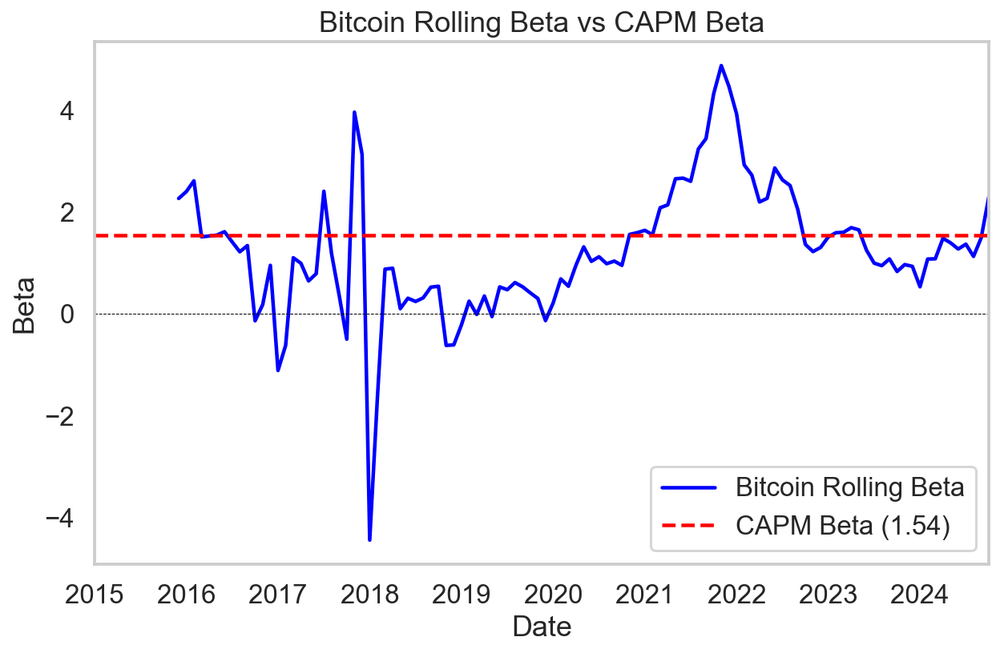


CAPM Regression Results for Gold:
                            OLS Regression Results                            
Dep. Variable:             GLD_excess   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                 -0.004
Method:                 Least Squares   F-statistic:                    0.5520
Date:                Thu, 26 Dec 2024   Prob (F-statistic):              0.459
Time:                        23:34:00   Log-Likelihood:                 211.54
No. Observations:                 118   AIC:                            -419.1
Df Residuals:                     116   BIC:                            -413.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.

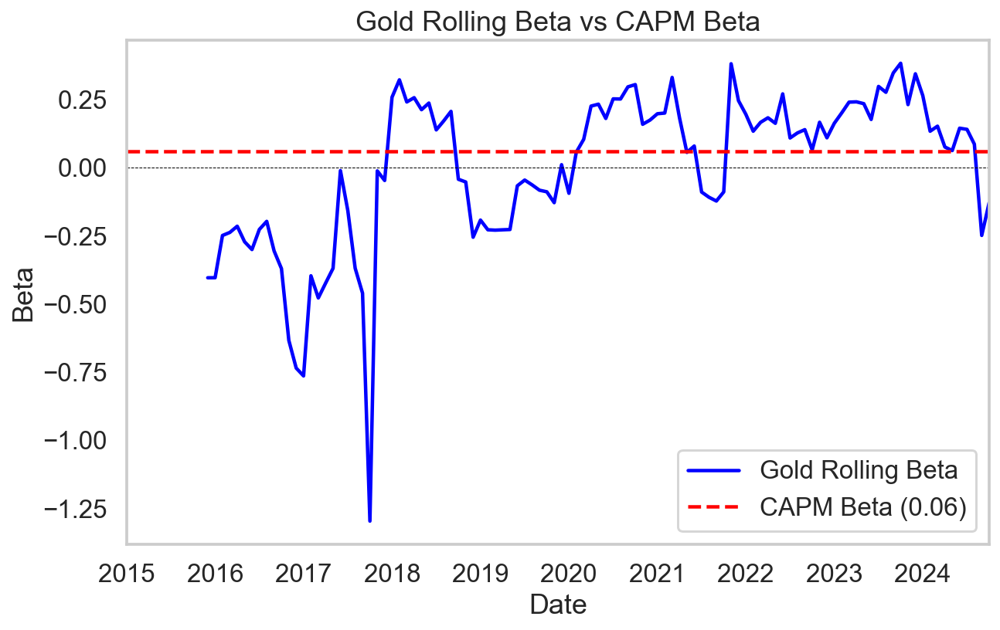

In [17]:
def get_data_for_capm(start_date='2015-01-01', end_date=None, frequency='D'):
    """
    Fetch Bitcoin, Gold, and Fama-French data for CAPM analysis.
    
    Parameters:
    start_date (str): Start date for data collection.
    end_date (str): End date for data collection.
    frequency (str): Data frequency ('D' for daily, 'M' for monthly).
    
    Returns:
    pd.DataFrame: Combined data including asset returns and market factors.
    """
    # Download Bitcoin data
    btc = (
        yf.download('BTC-USD', start=start_date, end=end_date, progress=False)
        ['Adj Close']
        .pct_change()
        .to_frame('BTC')
    )
    
    # Download Gold ETF data
    gld = (
        yf.download('GLD', start=start_date, end=end_date, progress=False)
        ['Adj Close']
        .pct_change()
        .to_frame('GLD')
    )
    
    # Get Fama-French daily factors
    ff_data = pdr.DataReader('F-F_Research_Data_Factors_daily', 'famafrench', start=start_date)[0]
    ff_data = ff_data / 100  # Convert percentages to decimal
    ff_data['Mkt'] = ff_data['Mkt-RF'] + ff_data['RF']  # Total market return

    # Combine data
    combined_data = pd.concat([btc, gld, ff_data[['Mkt', 'RF']]], axis=1).dropna()

    # Convert to monthly frequency if required
    if frequency == 'M':
        combined_data = combined_data.resample('M').agg(lambda x: (1 + x).prod() - 1)
    
    # Calculate excess returns
    combined_data['BTC_excess'] = combined_data['BTC'] - combined_data['RF']
    combined_data['GLD_excess'] = combined_data['GLD'] - combined_data['RF']
    
    return combined_data

def estimate_capm(data, asset_column, market_column='Mkt'):
    """
    Estimate CAPM regression for a given asset.
    
    Parameters:
    data (pd.DataFrame): Data containing asset and market returns.
    asset_column (str): Column containing the asset's excess returns.
    market_column (str): Column containing market excess returns.
    
    Returns:
    sm.OLS: Fitted CAPM model.
    """
    X = sm.add_constant(data[market_column])  # Add intercept
    y = data[asset_column]  # Asset excess returns
    model = sm.OLS(y, X).fit()
    return model

def rolling_beta(data, asset_column, market_column, window=30):
    """
    Calculate rolling beta over a specified window.
    
    Parameters:
    data (pd.DataFrame): Data containing asset and market returns.
    asset_column (str): Column containing the asset's excess returns.
    market_column (str): Column containing market excess returns.
    window (int): Rolling window size.
    
    Returns:
    pd.Series: Rolling beta values.
    """
    cov = data[[asset_column, market_column]].rolling(window).cov()
    var = data[market_column].rolling(window).var()
    rolling_beta = cov.unstack()[asset_column][market_column] / var
    return rolling_beta

def plot_capm_results(model, rolling_beta_series, asset_name):
    """
    Plot CAPM regression results and rolling beta analysis.
    
    Parameters:
    model (sm.OLS): Fitted CAPM model.
    rolling_beta_series (pd.Series): Rolling beta values.
    asset_name (str): Name of the asset.
    """
    # Extract regression parameters
    alpha = model.params['const']
    beta = model.params['Mkt']
    
    # Regression summary plot
    print(f"\nCAPM Regression Results for {asset_name}:")
    print(model.summary())
    
    # Rolling beta plot
    plt.figure(figsize=(10, 6))
    rolling_beta_series.plot(label=f"{asset_name} Rolling Beta", color="blue")
    plt.axhline(beta, color="red", linestyle="--", label=f"CAPM Beta ({beta:.2f})")
    plt.axhline(0, color="black", linestyle="--", linewidth=0.5)
    plt.title(f"{asset_name} Rolling Beta vs CAPM Beta")
    plt.xlabel("Date")
    plt.ylabel("Beta")
    plt.legend()
    plt.grid()
    plt.show()

# Fetch data
data = get_data_for_capm('2015-01-01', frequency='M')

# Bitcoin CAPM analysis
btc_model = estimate_capm(data, 'BTC_excess')
btc_rolling_beta = rolling_beta(data, 'BTC_excess', 'Mkt', window=12)
plot_capm_results(btc_model, btc_rolling_beta, 'Bitcoin')

# Gold CAPM analysis
gld_model = estimate_capm(data, 'GLD_excess')
gld_rolling_beta = rolling_beta(data, 'GLD_excess', 'Mkt', window=12)
plot_capm_results(gld_model, gld_rolling_beta, 'Gold')

In [29]:
# Function to fetch SP100 symbols
def get_sp100_symbols():
    wiki = pd.read_html('https://en.wikipedia.org/wiki/S%26P_100')[2]
    symbols = wiki['Symbol'].apply(lambda x: x.replace('.', '-')).tolist()
    return symbols

# Function to download data for SP100 symbols, Bitcoin, and Gold ETF
def download_data(symbols, start_date, end_date):
    # Filter symbols for which data is available for the full period of Bitcoin and Gold
    stocks_data = yf.download(symbols, start=start_date, end=end_date, progress=False)['Adj Close']
    btc_data = yf.download('BTC-USD', start=start_date, end=end_date, progress=False)['Adj Close']
    gld_data = yf.download('GLD', start=start_date, end=end_date, progress=False)['Adj Close']
    
    # Filter stocks with complete data for Bitcoin and Gold
    valid_dates = btc_data.index.intersection(gld_data.index)
    stocks_data = stocks_data.loc[valid_dates]
    
    return stocks_data, btc_data, gld_data

# Function to compute daily returns
def compute_returns(data):
    return data.pct_change().dropna()

# Function to calculate the efficient frontier using mean-variance optimization
def efficient_frontier(returns, num_portfolios=10000):
    mean_returns = returns.mean()
    cov_matrix = returns.cov()
    
    portfolio_returns = []
    portfolio_volatility = []
    portfolio_weights = []

    for _ in range(num_portfolios):
        weights = np.random.random(len(returns.columns))
        weights /= np.sum(weights)  # Ensure weights sum to 1
        
        port_return = np.sum(weights * mean_returns)
        port_volatility = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights)))

        portfolio_returns.append(port_return)
        portfolio_volatility.append(port_volatility)
        portfolio_weights.append(weights)

    return np.array(portfolio_returns), np.array(portfolio_volatility), portfolio_weights

# Function to plot the efficient frontier using Plotly for interactivity
def plot_efficient_frontier(stocks_returns, btc_returns=None, gld_returns=None):
    portfolio_returns, portfolio_volatility, _ = efficient_frontier(stocks_returns)
    sharpe_ratio = np.divide(portfolio_returns, portfolio_volatility, where=portfolio_volatility != 0)
    
    # Create the figure for efficient frontier plot
    fig = go.Figure()

    # Plot the efficient frontier for SP100 stocks
    fig.add_trace(go.Scatter(
        x=portfolio_volatility,
        y=portfolio_returns,
        mode='markers',
        marker=dict(
            color=sharpe_ratio,
            colorscale='Viridis',
            size=8,
            showscale=True
        ),
        name='SP100 Stocks'
    ))

    # Find the min and max Sharpe ratios and highlight them
    min_sharpe_idx = np.argmin(sharpe_ratio)
    max_sharpe_idx = np.argmax(sharpe_ratio)

    fig.add_trace(go.Scatter(
        x=[portfolio_volatility[min_sharpe_idx]],
        y=[portfolio_returns[min_sharpe_idx]],
        mode='markers',
        marker=dict(color='red', size=12, symbol='x'),
        name='Min Sharpe Ratio'
    ))

    fig.add_trace(go.Scatter(
        x=[portfolio_volatility[max_sharpe_idx]],
        y=[portfolio_returns[max_sharpe_idx]],
        mode='markers',
        marker=dict(color='green', size=12, symbol='x'),
        name='Max Sharpe Ratio'
    ))

    if btc_returns is not None and gld_returns is not None:
        # Combine SP100 stocks with Bitcoin and Gold for combined frontier
        combined_returns = pd.concat([stocks_returns, btc_returns, gld_returns], axis=1)
        portfolio_returns, portfolio_volatility, _ = efficient_frontier(combined_returns)
        combined_sharpe_ratio = np.divide(portfolio_returns, portfolio_volatility, where=portfolio_volatility != 0)

        fig.add_trace(go.Scatter(
            x=portfolio_volatility,
            y=portfolio_returns,
            mode='markers',
            marker=dict(
                color=combined_sharpe_ratio,
                colorscale='Plasma',
                size=8,
                showscale=True
            ),
            name='SP100 + Bitcoin + Gold'
        ))

    # Customize layout
    fig.update_layout(
        title='Efficient Frontier (SP100 Stocks, Bitcoin, Gold)',
        xaxis_title='Portfolio Volatility (Risk)',
        yaxis_title='Portfolio Return',
        showlegend=True,
        template='plotly_dark',
        height=800
    )

    # Show the interactive plot
    fig.show()

# Main function to get data, compute returns, and plot efficient frontier
def main():
    start_date = '2015-01-01'
    end_date = datetime.today().strftime('%Y-%m-%d')

    sp100_symbols = get_sp100_symbols()
    stocks_data, btc_data, gld_data = download_data(sp100_symbols, start_date, end_date)

    stocks_returns = compute_returns(stocks_data)
    btc_returns = compute_returns(btc_data)
    gld_returns = compute_returns(gld_data)

    plot_efficient_frontier(stocks_returns, btc_returns, gld_returns)

if __name__ == "__main__":
    main()

In [35]:
def get_sp100_symbols():
    wiki = pd.read_html('https://en.wikipedia.org/wiki/S%26P_100')[2]
    symbols = wiki['Symbol'].apply(lambda x: x.replace('.', '-')).tolist()
    return symbols

# Function to download data for SP100 symbols
def download_data(symbols, start_date, end_date):
    # Fetch adjusted close prices for SP100 symbols
    stocks_data = yf.download(symbols, start=start_date, end=end_date, progress=False)['Adj Close']
    return stocks_data

# Function to compute daily returns
def compute_returns(data):
    return data.pct_change().dropna()

# Function to calculate the efficient frontier using mean-variance optimization
def efficient_frontier(returns, num_portfolios=10000):
    mean_returns = returns.mean()
    cov_matrix = returns.cov()
    
    portfolio_returns = []
    portfolio_volatility = []
    portfolio_weights = []

    for _ in range(num_portfolios):
        weights = np.random.random(len(returns.columns))
        weights /= np.sum(weights)  # Ensure weights sum to 1
        
        port_return = np.sum(weights * mean_returns)
        port_volatility = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights)))

        portfolio_returns.append(port_return)
        portfolio_volatility.append(port_volatility)
        portfolio_weights.append(weights)

    return np.array(portfolio_returns), np.array(portfolio_volatility), portfolio_weights

# Function to plot the efficient frontier using Plotly
def plot_efficient_frontier(stocks_returns):
    portfolio_returns, portfolio_volatility, _ = efficient_frontier(stocks_returns)
    sharpe_ratio = np.divide(portfolio_returns, portfolio_volatility, where=portfolio_volatility != 0)
    
    # Create an interactive plotly scatter plot
    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=portfolio_volatility,
        y=portfolio_returns,
        mode='markers',
        marker=dict(
            color=sharpe_ratio,
            colorscale='Viridis',
            size=10,
            opacity=0.6,
            colorbar=dict(title='Sharpe Ratio')
        ),
        name='Portfolios'
    ))

    # Maximum Sharpe Ratio Portfolio
    max_sharpe_idx = np.argmax(sharpe_ratio)
    fig.add_trace(go.Scatter(
        x=[portfolio_volatility[max_sharpe_idx]],
        y=[portfolio_returns[max_sharpe_idx]],
        mode='markers',
        marker=dict(color='green', size=12),
        name='Max Sharpe Ratio'
    ))

    # Minimum Volatility Portfolio
    min_vol_idx = np.argmin(portfolio_volatility)
    fig.add_trace(go.Scatter(
        x=[portfolio_volatility[min_vol_idx]],
        y=[portfolio_returns[min_vol_idx]],
        mode='markers',
        marker=dict(color='red', size=12),
        name='Min Volatility'
    ))

    fig.update_layout(
        title='Efficient Frontier for SP100 Stocks',
        xaxis_title='Portfolio Volatility (Risk)',
        yaxis_title='Portfolio Return',
        template='plotly_dark',
        height=800,
        showlegend=True
    )

    fig.show()

# Main function to get data, compute returns, and plot the efficient frontier
def main():
    start_date = '2015-01-01'
    end_date = datetime.today().strftime('%Y-%m-%d')

    sp100_symbols = get_sp100_symbols()
    stocks_data = download_data(sp100_symbols, start_date, end_date)

    stocks_returns = compute_returns(stocks_data)
    plot_efficient_frontier(stocks_returns)

if __name__ == "__main__":
    main()

In [36]:
# Function to fetch SP100 symbols
def get_sp100_symbols():
    wiki = pd.read_html('https://en.wikipedia.org/wiki/S%26P_100')[2]
    symbols = wiki['Symbol'].apply(lambda x: x.replace('.', '-')).tolist()
    return symbols

# Function to download data for SP100 symbols
def download_data(symbols, start_date, end_date):
    # Fetch adjusted close prices for SP100 symbols only (no Bitcoin or Gold)
    stocks_data = yf.download(symbols, start=start_date, end=end_date, progress=False)['Adj Close']
    return stocks_data

# Function to compute daily returns
def compute_returns(data):
    return data.pct_change().dropna()

# Function to calculate the efficient frontier using mean-variance optimization
def efficient_frontier(returns, num_portfolios=10000):
    mean_returns = returns.mean()
    cov_matrix = returns.cov()
    
    portfolio_returns = []
    portfolio_volatility = []
    portfolio_weights = []

    for _ in range(num_portfolios):
        weights = np.random.random(len(returns.columns))
        weights /= np.sum(weights)  # Ensure weights sum to 1
        
        port_return = np.sum(weights * mean_returns)
        port_volatility = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights)))

        portfolio_returns.append(port_return)
        portfolio_volatility.append(port_volatility)
        portfolio_weights.append(weights)

    return np.array(portfolio_returns), np.array(portfolio_volatility), portfolio_weights

# Function to plot the efficient frontier using Plotly
def plot_efficient_frontier(stocks_returns):
    portfolio_returns, portfolio_volatility, _ = efficient_frontier(stocks_returns)
    sharpe_ratio = np.divide(portfolio_returns, portfolio_volatility, where=portfolio_volatility != 0)
    
    # Create an interactive plotly scatter plot
    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=portfolio_volatility,
        y=portfolio_returns,
        mode='markers',
        marker=dict(
            color=sharpe_ratio,
            colorscale='Viridis',
            size=10,
            opacity=0.6,
            colorbar=dict(title='Sharpe Ratio')
        ),
        name='Portfolios'
    ))

    # Maximum Sharpe Ratio Portfolio
    max_sharpe_idx = np.argmax(sharpe_ratio)
    fig.add_trace(go.Scatter(
        x=[portfolio_volatility[max_sharpe_idx]],
        y=[portfolio_returns[max_sharpe_idx]],
        mode='markers',
        marker=dict(color='green', size=12),
        name='Max Sharpe Ratio'
    ))

    # Minimum Volatility Portfolio
    min_vol_idx = np.argmin(portfolio_volatility)
    fig.add_trace(go.Scatter(
        x=[portfolio_volatility[min_vol_idx]],
        y=[portfolio_returns[min_vol_idx]],
        mode='markers',
        marker=dict(color='red', size=12),
        name='Min Volatility'
    ))

    fig.update_layout(
        title='Efficient Frontier for SP100 Stocks',
        xaxis_title='Portfolio Volatility (Risk)',
        yaxis_title='Portfolio Return',
        template='plotly_dark',
        height=800,
        showlegend=True
    )

    fig.show()

# Main function to get data, compute returns, and plot the efficient frontier
def main():
    start_date = '2015-01-01'
    end_date = datetime.today().strftime('%Y-%m-%d')

    sp100_symbols = get_sp100_symbols()  # Get SP100 symbols
    stocks_data = download_data(sp100_symbols, start_date, end_date)  # Download SP100 data

    stocks_returns = compute_returns(stocks_data)  # Compute daily returns for SP100 stocks
    plot_efficient_frontier(stocks_returns)  # Plot the efficient frontier

if __name__ == "__main__":
    main()